In [ ]:
#imports
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
#import numpy as np

In [ ]:
#"un-zipping"/converting dataset
db_path = '/content/drive/MyDrive/Machine Learning 2023/Data/wjazzd.db'
conn = sqlite3.connect(db_path)
cursor = conn.cursor()
query = "SELECT * FROM melody;"
cursor.execute(query)

results = cursor.fetchall()

In [ ]:
#printing dataset
for row in results:
    print(row)

Streaming output truncated to the last 5000 lines.
(3599, 6, 274.32142857142856, 66.0, 0.18571428571428572, 4, 6, 68, 3, 6, 0, 4, 4, 'None', 0.9326757369614143, '(1.0, 1.0, 1.366, 1.642, 1.057, 1.366)', '', 0.9275591603219999, 71.0272056348, 7.820635382110001, 0.294117647059, 0.541232741497, 1.0697358467882447, 195.350426415, None, 39.5117383903)
(3600, 6, 274.51836734693876, 68.0, 0.2030612244897959, 4, 12, 68, 4, 1, 0, 4, 4, 'None', 1.022471655328843, '(1.0, 1.0, 1.0, 1.685, 1.241, 1.241, 1.278, 1.278, 1.567, 1.249, 1.249, 1.02)', '', 0.9243811403740001, 71.9025324655, 7.305425209419999, 0.263157894737, 0.492860298992, 1.0382805827654937, 50.342314817200005, 5.26266882095, 12.2263783149)
(3601, 6, 274.7255102040816, 66.0, 0.10816326530612246, 4, 12, 68, 4, 4, 0, 4, 4, 'None', 1.022471655328843, '(1.0, 1.0, 1.0, 1.685, 1.241, 1.241, 1.278, 1.278, 1.567, 1.249, 1.249, 1.02)', '', -0.630489700964, 48.89875443, 5.2478092062699995, 0.0, 0.43072386331900003, 0.7346635524529506, 165.5675882

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(17397, 42, 22.632653061224488, 58.0, 0.07346938775510205, 4, 2, 18, 4, 2, 0, 4, 4, 'None', 0.22566893424036039, '(1.0, 1.686)', '', 0.115342489116, 61.9207050946, 1.39982824914, 1.0, 0.668878181334, 1.0985566568279699, 18.8873207484, None, 103.36732292)
(17398, 42, 22.73469387755102, 62.0, 0.1, 4, 2, 19, 1, 1, 0, 4, 4, 'None', 0.21900226757369623, '(1.0, 1.216)', '', 0.535261035525, 67.1644221282, 4.672722713440001, 0.444444444444, 0.58713385708, 0.9604575859493807, 72.4526204497, None, 104.741079121)
(17399, 42, 22.844897959183672, 65.0, 0.10612244897959183, 4, 2, 19, 1, 2, 0, 4, 4, 'None', 0.21900226757369623, '(1.0, 1.216)', '', -0.113774579451, 58.942542732, 3.9055599596099997, 0.6, 0.445740308506, 0.8632068788796198, 159.62736654100001, None, 96.4000593822)
(17400, 42, 22.953061224489797, 69.0, 0.12244897959183673, 4, 2, 19, 2, 1, 0, 4, 4, 'None', 0.21900226757369623, '(1.0, 0.69)', '', 0.72694467484, 68.1147106328, 7.30460326330

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(55484, 121, 20.103061224489796, 62.0, 0.11029478458049886, 4, 2, 17, 2, 2, 0, 4, 4, 'None', 0.26664399092970825, '(1.0, 0.866)', '', 0.9752129265180001, 74.953708877, 4.12163035204, 0.363636363636, 0.555605959129, 1.1416590239731501, 6.3330913508, None, 28.51005747)
(55485, 121, 20.244897959183675, 63.0, 0.11319727891156463, 4, 2, 17, 3, 1, 0, 4, 4, 'None', 0.26773242630385496, '(1.0, 0.862)', '', 0.8563393652529999, 73.9291162226, 2.1227578030400003, 0.8, 0.550124996871, 1.1545755671522644, 11.2533583353, 10.0913424446, 9.791771711280001)
(55486, 121, 20.3784126984127, 62.0, 0.12770975056689338, 4, 2, 17, 3, 2, 0, 4, 4, 'None', 0.26773242630385496, '(1.0, 0.862)', '', 0.888836409849, 71.8188052825, 4.01472331936, 0.416666666667, 0.5382412188710001, 1.1553974184781681, 47.8417222637, None, 33.1252929886)
(55487, 121, 20.506122448979593, 63.0, 0.15383219954648525, 4, 2, 17, 4, 1, 0, 4, 4, 'None', 0.2688208616780017, '(1.0, 0.542)', '',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(86693, 199, 60.63746031746032, 57.0, 0.07546485260770976, 4, 2, 66, 2, 2, 0, 4, 4, 'None', 0.19390022675737129, '(1.0, 0.508)', '', 0.678454705301, 70.1852412344, 2.3087426281, 0.5714285714289999, 0.53075154438, 1.0971347306578607, 23.577949939899998, None, -14.5196891557)
(86694, 199, 60.71727891156463, 54.0, 0.07256235827664399, 4, 2, 66, 3, 1, 0, 4, 4, 'None', 0.17782312925169919, '(1.0, 0.631)', '', 0.33557271244900005, 63.43127844399999, 3.5337169879800006, 0.0, 0.40719280556000004, 1.0420757407891834, 4.641339164780001, None, -12.8563139184)
(86695, 199, 60.817414965986394, 55.0, 0.07981859410430839, 4, 2, 66, 3, 2, 0, 4, 4, 'None', 0.17782312925169919, '(1.0, 0.631)', '', 0.19636502722100002, 65.44788946130001, 2.63064224058, 0.714285714286, 0.621886063609, 1.0800936746035523, 202.301404078, None, -109.177334694)
(86696, 199, 60.9233560090703, 56.0, 0.3091156462585034, 4, 1, 66, 4, 1, 0, 4, 4, 'None', 0.18900226757369865, '(1,)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(111314, 228, 101.50408163265305, 66.0, 0.02040816326530612, 3, 6, 97, 2, 5, 0, 3, 4, 'None', 0.34027210884353565, '(1.0, 1.0, 1.245, 1.018, 0.868, 1.158)', '', 0.700204044155, 71.9368349341, 3.14617789431, 0.0, 0.457727477667, 1.0410846279569308, 78.0402803734, None, 21.9081766489)
(111315, 228, 101.55102040816327, 63.0, 0.018367346938775512, 3, 6, 97, 2, 6, 0, 3, 4, 'None', 0.34027210884353565, '(1.0, 1.0, 1.245, 1.018, 0.868, 1.158)', '', 0.679917405437, 72.3034182877, 0.428149966375, 0.0, 0.0, 1.0522239591144344, 11.520196198199999, None, 19.169568651600002)
(111316, 228, 101.58979591836734, 62.0, 0.04897959183673469, 3, 4, 97, 3, 1, 0, 3, 4, 'None', 0.32655328798185224, '(1.0, 1.506, 1.506, 1.506)', '', 0.5667436499390001, 70.0735107301, 1.96272821852, 0.6, 0.360797934633, 1.0794624332723453, 19.0588011171, None, 12.6161629098)
(111317, 228, 101.64897959183673, 61.0, 0.6346938775510204, 3, 4, 97, 3, 2, 0, 3, 4, 'None', 0.326553287

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(127001, 271, 39.30816326530612, 67.0, 0.4, 4, 4, 17, 4, 2, 0, 4, 4, 'None', 0.45659863945578394, '(1.0, 1.023, 1.023, 1.023)', '', 0.899059095147, 73.1668476382, 2.19304823083, 0.7567567567569999, 0.484848420414, 1.1574851164972162, 22.809473614699996, 2.80558682291, 32.4394310164)
(127002, 271, 39.744897959183675, 70.0, 0.2714285714285714, 4, 6, 18, 1, 2, 0, 4, 4, 'None', 0.4122675736961412, '(1.0, 0.883, 0.883, 0.883, 0.883, 0.565)', '', 0.6925538253479999, 69.5741666087, 3.8192301490599996, 0.12, 0.42445598857100003, 1.1616260154568177, 19.6136137896, 7.1584135479699995, 17.5282326316)
(127003, 271, 40.03061224489796, 67.0, 0.08571428571428572, 4, 6, 18, 1, 6, 0, 4, 4, 'None', 0.4122675736961412, '(1.0, 0.883, 0.883, 0.883, 0.883, 0.565)', '', 0.306670499393, 61.3358079213, 4.069008960450001, 0.5, 0.412203121923, 1.0345437391528685, 71.01893386229999, None, 40.5632775875)
(127004, 271, 40.142857142857146, 70.0, 0.2693877551020408, 4, 3, 18, 2, 1, 0, 4, 4, 'None', 0.432471655328797

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(134210, 297, 25.857142857142858, 77.0, 0.1469387755102041, 4, 3, 18, 4, 1, 0, 4, 4, 'None', 0.2953287981859418, '(1.0, 1.0, 0.837)', '', 1.19563992699, 71.5088307894, 7.247956235549999, 0.428571428571, 0.429875876044, 1.129553366406425, 43.4608475985, None, 7.8816438474)
(134211, 297, 26.06530612244898, 80.0, 0.1673469387755102, 4, 3, 18, 4, 3, 0, 4, 4, 'None', 0.2953287981859418, '(1.0, 1.0, 0.837)', '', 0.859107370656, 69.38925212550001, 12.6769988721, 0.3125, 0.562097745808, 1.1889080326301558, 21.5455560971, 6.98486557957, -40.7948123034)
(134212, 297, 26.35, 80.0, 0.10204081632653061, 4, 2, 19, 1, 2, 0, 4, 4, 'None', 0.29616780045351376, '(1.0, 0.579)', '', 1.00055036677, 70.7284839015, 6.204374941059999, 0.4, 0.403825025959, 1.0309907756788736, 11.803950215499999, 11.590003908499998, -25.906557192199998)
(134213, 297, 26.478571428571428, 76.0, 0.14795918367346939, 4, 1, 19, 2, 1, 0, 4, 4, 'None', 0.3124716553287996, '(1,)', '', 0.80045858412, 68.7511944396, 6.53220771031, 0.4285

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(142559, 310, 19.857142857142858, 65.0, 0.08571428571428572, 4, 3, 18, 3, 3, 0, 4, 4, 'None', 0.25539682539682573, '(1.0, 1.0, 1.209)', '', 0.752131949267, 68.5202699419, 3.46983402536, 0.25, 0.419784205749, 1.0958875364685647, 27.6488905538, None, -18.5286850122)
(142560, 310, 19.957142857142856, 63.0, 0.11632653061224489, 4, 2, 18, 4, 1, 0, 4, 4, 'None', 0.21877551020408248, '(1.0, 0.54)', '', 0.046439838435800004, 60.6801658692, 3.98106370204, 0.636363636364, 0.438756919151, 0.8712309485544868, 175.088440972, None, -9.61675674515)
(142561, 310, 20.077551020408162, 61.0, 0.10612244897959183, 4, 2, 18, 4, 2, 0, 4, 4, 'None', 0.21877551020408248, '(1.0, 0.54)', '', 0.38499236081999993, 62.5846465277, 5.6001041979499995, 1.0, 0.669671368108, 0.945704526345732, 31.930743269, None, -28.5597595829)
(142562, 310, 20.187755102040818, 60.0, 0.20408163265306123, 4, 1, 19, 1, 1, 0, 4, 4, 'None', 0.2695918367346941, '(1,)', '', 0.384992360819999

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(155875, 342, 74.98367346938775, 59.0, 0.08163265306122448, 4, 2, 87, 4, 1, 0, 4, 4, 'None', 0.18469387755102673, '(1.0, 0.792)', '', None, 63.454346774499996, 1.8768717367299999, 0.28571428571400004, 0.35170758311300004, 1.0525667920254596, 85.0847203504, None, 5.252274891)
(155876, 342, 75.09183673469387, 64.0, 0.09795918367346938, 4, 2, 87, 4, 2, 0, 4, 4, 'None', 0.18469387755102673, '(1.0, 0.792)', '', None, 72.0005717497, 1.47307647743, 0.0, 0.22920329686000002, 1.2151539543828611, 17.7901062674, 12.8284064329, 11.7221368069)
(155877, 342, 75.20408163265306, 63.0, 0.12040816326530612, 4, 1, 88, 1, 1, 0, 4, 4, 'None', 0.2030272108843576, '(1,)', '', None, 69.0667988959, 6.57768746413, 0.0909090909091, 0.335090289108, 1.129793619080736, 35.9892027917, 12.1755794361, 2.1831678402400003)
(155878, 342, 75.35306122448979, 62.0, 0.08979591836734693, 4, 2, 88, 2, 1, 0, 4, 4, 'None', 0.2030272108843576, '(1.0, 0.915)', '', None, 69.1093335209, 1.7025515187399998, 0.25, 0.5370721421369999,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(163845, 363, 30.5059410430839, 67.0, 0.03192743764172336, 4, 3, 26, 1, 1, 0, 4, 4, 'None', 0.25155328798186005, '(1.0, 3.06, 2.428)', 'slide', 0.608677773424, 67.30500253390001, 1.99642926258, 0.33333333333299997, 0.590864622769, 0.997790503362697, 40.751563373, None, 30.8508292211)
(163846, 363, 30.54222222222222, 68.0, 0.09505668934240363, 4, 3, 26, 1, 2, 0, 4, 4, 'None', 0.25155328798186005, '(1.0, 3.06, 2.428)', '', 0.809428817579, 69.5717913589, 4.80176485261, 0.375, 0.366005198244, 1.1014389515682634, 13.6047595623, None, 10.3128588377)
(163847, 363, 30.65324263038549, 69.0, 0.1291609977324263, 4, 3, 26, 1, 3, 0, 4, 4, 'None', 0.25155328798186005, '(1.0, 3.06, 2.428)', '', 0.8987518807479999, 71.5038467804, 1.9240359251499999, 0.583333333333, 0.45730686278399996, 1.0348185894808246, 23.5791622006, None, 1.8633113490900002)
(163848, 363, 30.790385487528344, 70.0, 0.09505668934240363, 4, 2, 26, 2, 1, 0, 4, 4, 'None', 0.25155328798186005, '(1.0, 0.957)', '', 0.7828108151809999, 68.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(171472, 386, 61.030748299319725, 67.0, 0.1567346938775529, 4, 2, 55, 3, 1, 0, 4, 4, 'None', 0.2681179138321994, '(1.0, 0.501)', '', 1.10021015393, 72.906785537, 3.1892817706700005, 0.5714285714289999, 0.451846084845, 1.0924744774934143, 22.737362156, 8.47985106678, -24.5801610614)
(171473, 386, 61.18748299319728, 65.0, 0.08707482993197278, 4, 2, 55, 3, 2, 0, 4, 4, 'None', 0.2681179138321994, '(1.0, 0.501)', '', 0.46449377983199996, 70.5471815739, 1.5089118472799998, 0.625, 0.451224882835, 1.05784113467238, 8.706944023250001, 13.410501395999999, 7.21928148107)
(171474, 386, 61.28326530612245, 64.0, 0.11609977324263039, 4, 2, 55, 4, 1, 0, 4, 4, 'None', 0.27664399092970626, '(1.0, 0.986)', '', 0.8325169259999999, 72.516789341, 1.58888987375, 0.181818181818, 0.451904936927, 1.1188358832129925, 21.5548522108, None, 0.912298497326)
(171475, 386, 61.413877551020406, 62.0, 0.12480725623582767, 4, 2, 55, 4, 2, 0, 4, 4, 'None', 0.27664399092970626, '(1.0, 0.986)', '', 1.00881682461, 73.7852001

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
(195810, 441, 33.56734693877551, 77.0, 0.07755102040816327, 4, 4, 22, 2, 1, 0, 4, 4, 'None', 0.3592743764172326, '(1.0, 0.655, 0.773, 0.773)', '', 0.6898852575059999, 68.9470849503, 8.07032783528, 0.5714285714289999, 0.392745324183, 1.039258227688703, 30.897680784400002, None, -27.2805478362)
(195811, 441, 33.679591836734694, 81.0, 0.04285714285714286, 4, 4, 22, 2, 2, 0, 4, 4, 'None', 0.3592743764172326, '(1.0, 0.655, 0.773, 0.773)', '', 0.622601184381, 68.8496779177, 4.943170267, 0.75, 0.71330950322, 1.0717243815729225, 29.889144671900002, None, -16.6595159517)
(195812, 441, 33.7530612244898, 81.0, 0.21836734693877552, 4, 4, 22, 2, 3, 0, 4, 4, 'None', 0.3592743764172326, '(1.0, 0.655, 0.773, 0.773)', '', 0.878570689957, 72.7124721831, 1.0432768121200002, 0.45, 0.477720686461, 1.177668902939078, 10.4852124934, 7.736808423029999, -16.4301877019)
(195813, 441, 34.00408163265306, 79.0, 0.07755102040816327, 4, 4, 22, 3, 2, 0, 4, 4, 'None',

In [ ]:
#converting data to pandas
query = "SELECT * FROM melody;"

df_melody = pd.read_sql_query(query, conn)
df_melody.head()

,eventid,melid,onset,pitch,duration,period,division,bar,beat,tatum,...,f0_mod,loud_max,loud_med,loud_sd,loud_relpos,loud_cent,loud_s2b,f0_range,f0_freq_hz,f0_med_dev
0,1,1,10.343492,65.0,0.138776,4,1,0,1,1,...,,0.126209,66.526087,5.541147,0.307692,0.389466,1.056169,37.794261,12.932532,-0.328442
1,2,1,10.637642,63.0,0.171247,4,4,0,2,1,...,,0.349751,69.133321,2.912412,0.250000,0.468687,1.120317,6.365930,6.956935,11.135423
2,3,1,10.843719,58.0,0.081270,4,4,0,2,4,...,,0.094051,66.352130,3.564563,0.428571,0.531354,1.310389,68.010392,NaN,32.366787
3,4,1,10.948209,61.0,0.235102,4,1,0,3,1,...,,0.521187,66.484173,2.414298,0.818182,0.559333,0.984047,15.443906,5.867151,-3.374696
4,5,1,11.232653,63.0,0.130612,4,1,0,4,1,...,,0.560737,71.699054,2.185794,0.166667,0.438973,1.061262,11.444363,8.329975,6.377737


**Explanation of Features**

eventid: A unique identifier for each event or entry in the melody table. It serves as a primary key to uniquely identify each row in the dataset.

melid: An identifier for the melody to which each event belongs. If there are multiple events per melody, they would share the same melid.

onset: The starting time of the note or event in the melody, typically measured in seconds from the beginning of the track.

pitch: The pitch of the note, usually measured in MIDI note numbers. MIDI notes represent specific pitches in Western music.

duration: The length of time for which the note is played, measured in seconds.

period: The time signature or metrical structure within which the event occurs.

division: The rhythmic division of the beat or bar in music.

bar: The bar number in the musical piece where the event occurs.

beat: The beat number within the bar where the event takes place.

tatum: A tatum is the smallest rhythmic unit in a piece of music.

The remaining columns include more technical and advanced musical features:

f0_mod: Related to the modulation of the fundamental frequency (f0) of the note.

loud_max: The maximum loudness (volume) of the note or event.

loud_med: The median loudness of the note, indicating the most common volume level during its duration.

loud_sd: Standard deviation of loudness, showing the variability in volume.

loud_relpos: Relative position of loudness, perhaps indicating where in the duration of the note the peak or median loudness occurs.

loud_cent: A centroid measure for loudness, indicating a 'center' of loudness over time.

loud_s2b: A measure of loudness from start to beat or a similar temporal loudness measure.

f0_range: The range of the fundamental frequency across the event, indicating variability in pitch.

f0_freq_hz: The frequency of the fundamental pitch of the note in Hertz.

f0_med_dev: Deviation from the median fundamental frequency, indicating how much the pitch varies from the median.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


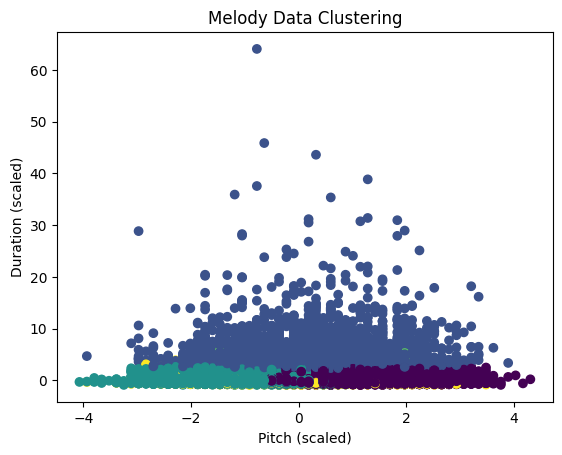

In [ ]:
#Grouping together the notes to visualize the relationship between pitch and duration of notes

df = pd.read_sql_query("SELECT pitch, duration, loud_max, period, division FROM melody;", conn)

df.fillna(df.mean(), inplace=True)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df)

kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

df['Cluster'] = clusters

plt.scatter(scaled_features[:, 0], scaled_features[:, 1], c=clusters, cmap='viridis', marker='o')
plt.xlabel('Pitch (scaled)')
plt.ylabel('Duration (scaled)')
plt.title('Melody Data Clustering')
plt.show()

Iteration 1

In [ ]:
#Creating a target column 'next_pitch', which consists of the pitch of the following entry in the dataset
df = pd.read_sql_query("SELECT * FROM melody LIMIT 10000;", conn)
df = df.dropna(subset=['pitch'])
df['next_pitch'] = df['pitch'].shift(-1)

df = df[:-1]

#Using features after selection (no need to overcomplicate with too many features)
X = df[['onset', 'pitch', 'duration', 'period', 'division', 'bar', 'beat', 'tatum']]
y = df['next_pitch']

In [ ]:
#Fitting, instantiating, and predicting with the model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

In [ ]:
#Finding the mean squared error and root mean squared error to measure accuracy of the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

mse, rmse

(11.875703595463433, 3.446114274870094)

Iteration 2

In [ ]:
##Creating a different version of the target column 'next_pitch', which consists of the pitch of the following entry in the dataset as long as it is in the same melody, so no uncorrelated notes are predicted off of eachother
df = pd.read_sql_query("SELECT * FROM melody LIMIT 10000;", conn)
df = df.dropna(subset=['pitch'])
processed_df = pd.DataFrame()

for melid in df['melid'].unique():
    temp_df = df[df['melid'] == melid]
    temp_df['next_pitch'] = temp_df['pitch'].shift(-1)
    processed_df = pd.concat([processed_df, temp_df[:-1]])

X = processed_df[['onset', 'pitch', 'duration', 'period', 'division', 'bar', 'beat', 'tatum']]
y = processed_df['next_pitch']

<ipython-input-19-e9429a9934df>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['next_pitch'] = temp_df['pitch'].shift(-1)
<ipython-input-19-e9429a9934df>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['next_pitch'] = temp_df['pitch'].shift(-1)
<ipython-input-19-e9429a9934df>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

mse, rmse

(11.875703595463433, 3.446114274870094)